<a href="https://colab.research.google.com/github/JudsonLima/computationalImaging/blob/master/HW3_JudsonLimaTrial2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Computational Imaging HW 3

Judson Lima

OPTI 556, Fall 2023

##Libraries

In [6]:
import numpy as np
import tensorflow as tf
import tensorflow.keras as keras
from tensorflow.keras import layers, models
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.models import Model
from tensorflow.keras.activations import gelu, elu, sigmoid, swish, relu
import matplotlib.pyplot as plt
from scipy import interpolate as interp
from scipy.special import expit
from google.colab import files
from skimage.metrics import mean_squared_error as mse
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
import imageio
from PIL import Image
import cv2
import os
%matplotlib inline
plt.rcParams['figure.figsize'] = [20, 10]
tf.experimental_relax_shapes=True

import torch
from torch import nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
from torchvision.transforms import Resize, Compose, ToTensor, Normalize, PILToTensor
import skimage
import time

def get_mgrid(sidelen, dim=2):
    '''Generates a flattened grid of (x,y,...) coordinates in a range of -1 to 1.
    sidelen: int
    dim: int'''
    tensors = tuple(dim * [torch.linspace(-1, 1, steps=sidelen)])
    mgrid = torch.stack(torch.meshgrid(*tensors), dim=-1)
    mgrid = mgrid.reshape(-1, dim)
    return mgrid

### Activation functions

The structure of the activation function is the backbone to the operation of neural networks. depicted below are the common activation functions used for the success of multilayer backpropagation learning. The vanishing gradient problem, where the derivative vanishes over the range, is a particular issue amoung the use of different activation functions. The gelu and elu are attempts at solving this problem. It can be noted that structure of the activation function itself can be a trainable parameter.

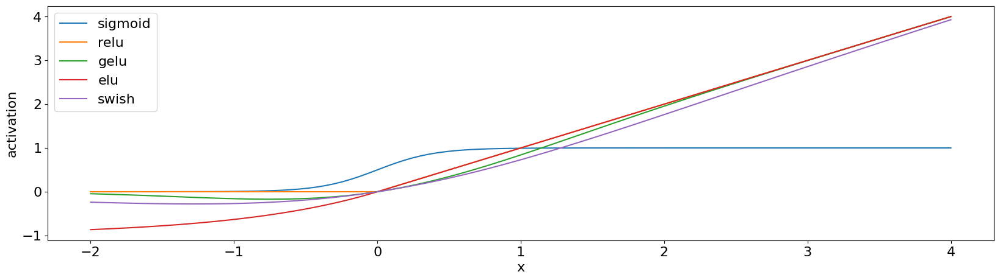

In [7]:
#
# relu, sigmoid and softmax optimization functions
#
plt.rcParams['figure.figsize'] = [20, 5]
plt.rcParams.update({'font.size': 16})
x=np.linspace(-2,4,100)
plt.plot(x,sigmoid(5*x),label='sigmoid')
plt.plot(x,relu(x),label='relu')
plt.plot(x,gelu(x),label='gelu')
plt.plot(x,elu(x),label='elu')
plt.plot(x,swish(x),label='swish')
plt.xlabel('x')
plt.ylabel('activation')
plt.legend()

In [8]:
!pip install visualkeras
import visualkeras

In [5]:
!pip install rawpy
import rawpy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 11.0 MB/s eta 0:00:00


## Demosaicing with neural processing



Training data set:

The Kodak photo cd data set, which was digitized from film as raw, is used for training. 24 images are broken down into sub images to get more trainable sets for the algorithm.

These images were never sampled uisng CFA and are raw rgb images.

image set comes from https://www.kaggle.com/datasets/sherylmehta/kodak-dataset?select=kodim24.png and are available as in png format.

In [9]:
!wget --no-check-certificate --content-disposition 'https://github.com/JudsonLima/computationalImaging/raw/master/images/Kodakim/kodim01.png'
!wget --no-check-certificate --content-disposition 'https://github.com/JudsonLima/computationalImaging/raw/master/images/Kodakim/kodim02.png'
!wget --no-check-certificate --content-disposition 'https://github.com/JudsonLima/computationalImaging/raw/master/images/Kodakim/kodim03.png'
!wget --no-check-certificate --content-disposition 'https://github.com/JudsonLima/computationalImaging/raw/master/images/Kodakim/kodim04.png'
!wget --no-check-certificate --content-disposition 'https://github.com/JudsonLima/computationalImaging/raw/master/images/Kodakim/kodim05.png'
!wget --no-check-certificate --content-disposition 'https://github.com/JudsonLima/computationalImaging/raw/master/images/Kodakim/kodim06.png'
!wget --no-check-certificate --content-disposition 'https://github.com/JudsonLima/computationalImaging/raw/master/images/Kodakim/kodim07.png'
!wget --no-check-certificate --content-disposition 'https://github.com/JudsonLima/computationalImaging/raw/master/images/Kodakim/kodim08.png'
!wget --no-check-certificate --content-disposition 'https://github.com/JudsonLima/computationalImaging/raw/master/images/Kodakim/kodim09.png'
!wget --no-check-certificate --content-disposition 'https://github.com/JudsonLima/computationalImaging/raw/master/images/Kodakim/kodim10.png'
!wget --no-check-certificate --content-disposition 'https://github.com/JudsonLima/computationalImaging/raw/master/images/Kodakim/kodim11.png'
!wget --no-check-certificate --content-disposition 'https://github.com/JudsonLima/computationalImaging/raw/master/images/Kodakim/kodim12.png'
!wget --no-check-certificate --content-disposition 'https://github.com/JudsonLima/computationalImaging/raw/master/images/Kodakim/kodim13.png'
!wget --no-check-certificate --content-disposition 'https://github.com/JudsonLima/computationalImaging/raw/master/images/Kodakim/kodim14.png'
!wget --no-check-certificate --content-disposition 'https://github.com/JudsonLima/computationalImaging/raw/master/images/Kodakim/kodim15.png'
!wget --no-check-certificate --content-disposition 'https://github.com/JudsonLima/computationalImaging/raw/master/images/Kodakim/kodim16.png'
!wget --no-check-certificate --content-disposition 'https://github.com/JudsonLima/computationalImaging/raw/master/images/Kodakim/kodim17.png'
!wget --no-check-certificate --content-disposition 'https://github.com/JudsonLima/computationalImaging/raw/master/images/Kodakim/kodim18.png'
!wget --no-check-certificate --content-disposition 'https://github.com/JudsonLima/computationalImaging/raw/master/images/Kodakim/kodim19.png'
!wget --no-check-certificate --content-disposition 'https://github.com/JudsonLima/computationalImaging/raw/master/images/Kodakim/kodim20.png'
!wget --no-check-certificate --content-disposition 'https://github.com/JudsonLima/computationalImaging/raw/master/images/Kodakim/kodim21.png'
!wget --no-check-certificate --content-disposition 'https://github.com/JudsonLima/computationalImaging/raw/master/images/Kodakim/kodim22.png'
!wget --no-check-certificate --content-disposition 'https://github.com/JudsonLima/computationalImaging/raw/master/images/Kodakim/kodim23.png'
!wget --no-check-certificate --content-disposition 'https://github.com/JudsonLima/computationalImaging/raw/master/images/Kodakim/kodim24.png'

--2023-10-04 07:28:40--  https://github.com/JudsonLima/computationalImaging/raw/master/images/Kodakim/kodim01.png
Resolving github.com (github.com)... 140.82.112.4
Connecting to github.com (github.com)|140.82.112.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/JudsonLima/computationalImaging/master/images/Kodakim/kodim01.png [following]
--2023-10-04 07:28:40--  https://raw.githubusercontent.com/JudsonLima/computationalImaging/master/images/Kodakim/kodim01.png
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.109.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 736501 (719K) [image/png]
Saving to: ‘kodim01.png’

kodim01.png         100%[===================>] 719.24K  --.-KB/s    in 0.04s   

2023-10-04 07:28:41 (19.4 MB/s) - ‘kodim01.png’ saved [7

In [10]:
im=np.zeros((24,512,768,3))
for pop in range(1,9):
  fileN="kodim0"+str(pop)+".png"
  imm = Image.open(fileN)
  imm=np.array(imm)
  w,h,c =imm.shape
  if w>h:
    imm=imm.transpose(1,0,2)
  im[pop-1,:,:,:]=np.array(imm)/255.
for pop in range(10,24):
  fileN="kodim"+str(pop)+".png"
  imm = Image.open(fileN)
  imm=np.array(imm)
  w,h, c =imm.shape
  if w>h:
    imm=imm.transpose(1,0,2)
  im[pop-1,:,:,:]=np.array(imm)/255.

(-0.5, 767.5, 511.5, -0.5)

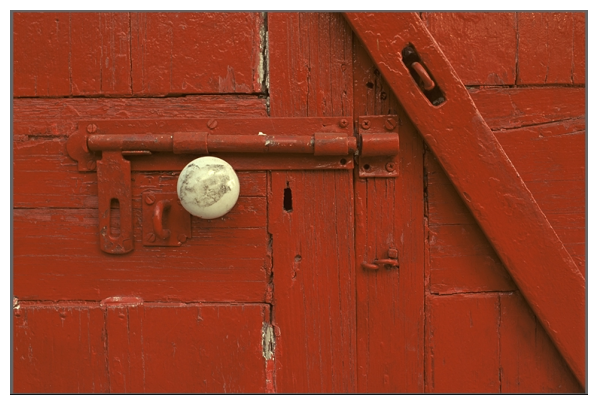

In [11]:
plt.imshow(im[1,:,:,:])
plt.axis('off')

### Color sampling functions

In [12]:
#This is the filter array for Bayer color sampling
def bayerCFA(shape,dtype='none'):
    kernel = np.array([[[1,0,0],[0,0,0]],[[0,0,0],[0,0,0]]])
    kernel = np.stack((kernel,np.array([[[0,0,0],[0,1,0]],[[0,0,0],[0,0,0]]]),np.array([[[0,0,0],[0,0,0]],[[0,1,0],[0,0,0]]]),np.array([[[0,0,0],[0,0,0]],[[0,0,0],[0,0,1]]] )),axis=-1)
    return kernel

In [13]:
# This network transforms a 32 by 32 color image into a 16 by 16 by 4 bayer sample array
inputs = layers.Input(shape=(None,None,3))
cfa = layers.Conv2D(4, (2,2), (2,2), use_bias=False, input_shape=(32,32,3),kernel_initializer=bayerCFA, trainable=False)(inputs)
cfaSample=Model(inputs,cfa)

In [14]:
def rgb2bayerGR2(image):
  w,h, c=image.shape
  bayer=np.zeros((w,h))
  bayer[0:w:2,0:h:2]=image[0:w:2,0:h:2,1]
  bayer[1:w:2,1:h:2]=image[1:w:2,1:h:2,1]
  bayer[0:w:2,1:h:2]=image[0:w:2,1:h:2,0]
  bayer[1:w:2,0:h:2]=image[1:w:2,0:h:2,2]
  bayer=255*bayer/np.max(bayer)
  bayer=bayer.astype('uint8')
  return bayer

In [15]:
sampleImg = cfaSample.predict(im[3:4,:,:,:])

1/1 [==============================] - 0s 207ms/step


(-0.5, 383.5, 255.5, -0.5)

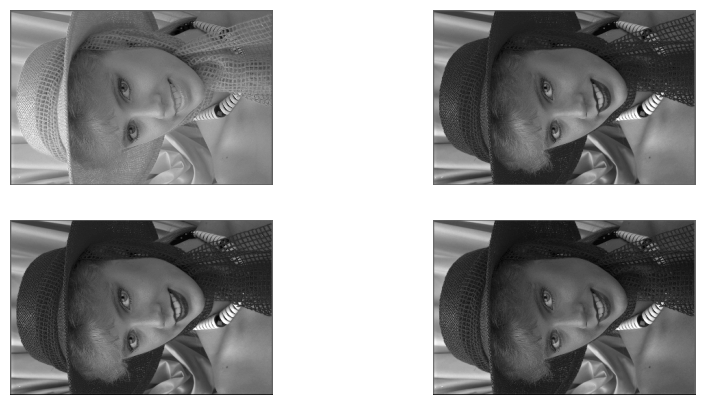

In [16]:
plt.rcParams['figure.figsize'] = [10, 5]
plt.gray()
plt.subplot(2,2,1)
plt.imshow(sampleImg[0,:,:,0])
plt.axis('off')
plt.subplot(2,2,2)
plt.imshow(sampleImg[0,:,:,1])
plt.axis('off')
plt.subplot(2,2,3)
plt.imshow(sampleImg[0,:,:,2])
plt.axis('off')
plt.subplot(2,2,4)
plt.imshow(sampleImg[0,:,:,3])
plt.axis('off')

### Training Blocks

Each image consists of 4 by 6=24 128 by 128 blocks. We use the first 20 images to generate 480 training images and the last 4 images to generate 96 test images

In [17]:
trainS=480
testS=96
xtrain=np.zeros((trainS,64,64,4))
ytrain=np.zeros((trainS,128,128,3))
xtest=np.zeros((testS,64,64,4))
ytest=np.zeros((testS,128,128,3))
for imc in range(20):
  for row in range(4):
    for column in range(6):
      ytrain[(imc*24+row*6+column),:,:,:]=im[imc,(row*128):((row+1)*128),(column*128):((column+1)*128),:]
      xtrain[(imc*24+row*6+column),:,:,:]=cfaSample.predict(im[imc:(imc+1),(row*128):((row+1)*128),(column*128):((column+1)*128),:])
for imc in range(4):
  for row in range(4):
    for column in range(6):
      ytest[(imc*24+row*6+column),:,:,:]=im[imc+20,(row*128):((row+1)*128),(column*128):((column+1)*128),:]
      xtest[(imc*24+row*6+column),:,:,:]=cfaSample.predict(im[(imc+20):(imc+21),(row*128):((row+1)*128),(column*128):((column+1)*128),:])
xtrain=np.reshape(xtrain, (len(xtrain), 64, 64, 4))
ytrain=np.reshape(ytrain, (len(ytrain), 128, 128, 3))
xtest=np.reshape(xtest, (len(xtest), 64, 64, 4))
ytest=np.reshape(ytest, (len(ytest), 128, 128, 3))
train_dataset = tf.data.Dataset.from_tensor_slices((xtrain, ytrain))
test_dataset = tf.data.Dataset.from_tensor_slices((xtest,ytest))
BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 100

train_dataset = train_dataset.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
test_dataset = test_dataset.batch(BATCH_SIZE)

1/1 [==============================] - 0s 20ms/step


## Network Architecture

autoencoder with residuals

In [18]:
inputs = layers.Input(shape=(None,None,4))
# Encoder
x1 = layers.Conv2D(16, (2, 2), strides=2, activation="gelu", padding="same")(inputs)
x = layers.MaxPooling2D((2, 2))(x1)
x2 = layers.Conv2D(16, (3, 3), activation="gelu", padding="same")(x)
x3 = layers.Conv2D(16, (3, 3), strides=2, activation="relu", padding="same")(x2)
x = layers.MaxPooling2D((2, 2))(x3)
x = layers.Conv2D(16, (3, 3),  activation="gelu", padding="same")(x)
# Decoder
x = layers.Conv2DTranspose(16, (3, 3), strides=2, activation="gelu", padding="same")(x)

x = layers.Conv2DTranspose(16, (3, 3), strides=2, activation="gelu", padding="same")(x)
x=layers.add([x,x2])
x = layers.Conv2DTranspose(16, (3, 3), strides=2, activation="gelu", padding="same")(x)
x=layers.add([x,x1])
x = layers.Conv2DTranspose(4, (3, 3), strides=2, activation="gelu", padding="same")(x)
x=layers.add([x,inputs])
x = layers.Conv2DTranspose(3, (3, 3), strides=2, activation="gelu", padding="same")(x)
x = layers.Conv2D(3, (3, 3), activation="relu", padding="same")(x)

# Autoencoder
demosaic = Model(inputs, x)
demosaic.compile(optimizer="adam", loss="mean_squared_error")
demosaic.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, None, None, 4)]      0         []                            
                                                                                                  
 conv2d_1 (Conv2D)           (None, None, None, 16)       272       ['input_2[0][0]']             
                                                                                                  
 max_pooling2d (MaxPooling2  (None, None, None, 16)       0         ['conv2d_1[0][0]']            
 D)                                                                                               
                                                                                                  
 conv2d_2 (Conv2D)           (None, None, None, 16)       2320      ['max_pooling2d[0][0]'] 

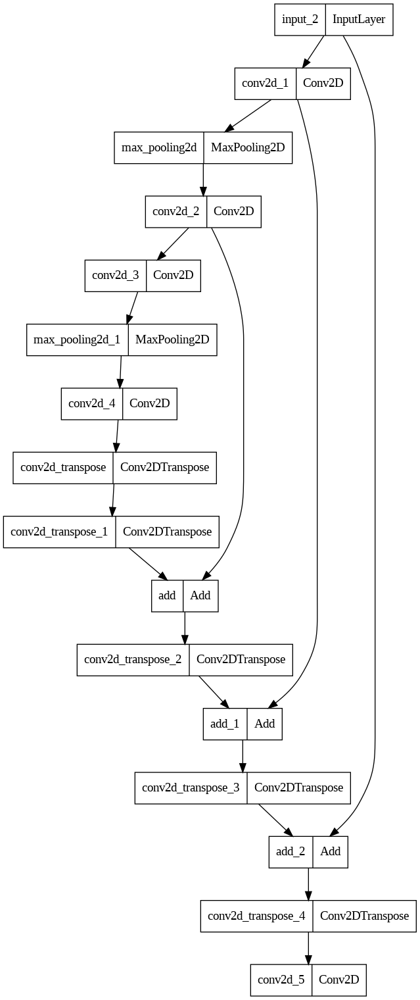

In [19]:
keras.utils.plot_model(demosaic)

In [20]:
demosaic.fit(train_dataset,
    epochs=1000,
    batch_size=32,
    shuffle=True,
    validation_data=test_dataset
)

Epoch 1/1000
15/15 [==============================] - 7s 331ms/step - loss: 0.1625 - val_loss: 0.1038
Epoch 2/1000
15/15 [==============================] - 7s 483ms/step - loss: 0.1059 - val_loss: 0.0583
Epoch 3/1000
15/15 [==============================] - 9s 569ms/step - loss: 0.0481 - val_loss: 0.0276
Epoch 4/1000
15/15 [==============================] - 5s 340ms/step - loss: 0.0234 - val_loss: 0.0178
Epoch 5/1000
15/15 [==============================] - 6s 428ms/step - loss: 0.0158 - val_loss: 0.0143
Epoch 6/1000
15/15 [==============================] - 5s 312ms/step - loss: 0.0133 - val_loss: 0.0129
Epoch 7/1000
15/15 [==============================] - 6s 395ms/step - loss: 0.0122 - val_loss: 0.0122
Epoch 8/1000
15/15 [==============================] - 6s 399ms/step - loss: 0.0114 - val_loss: 0.0116
Epoch 9/1000
15/15 [==============================] - 5s 306ms/step - loss: 0.0109 - val_loss: 0.0112
Epoch 10/1000
15/15 [==============================] - 5s 307ms/step - loss: 0.010

In [21]:
demosaic.save("demosaic")
!tar -czvf demosaic.tar.gz demosaic/
files.download('demosaic.tar.gz')

demosaic/
demosaic/saved_model.pb
demosaic/assets/
demosaic/fingerprint.pb
demosaic/variables/
demosaic/variables/variables.data-00000-of-00001
demosaic/variables/variables.index
demosaic/keras_metadata.pb


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### Test of the samples not trained

In [22]:
sampleImg=demosaic.predict(cfaSample.predict(im[22:23,:,:,:]))

1/1 [==============================] - 1s 518ms/step


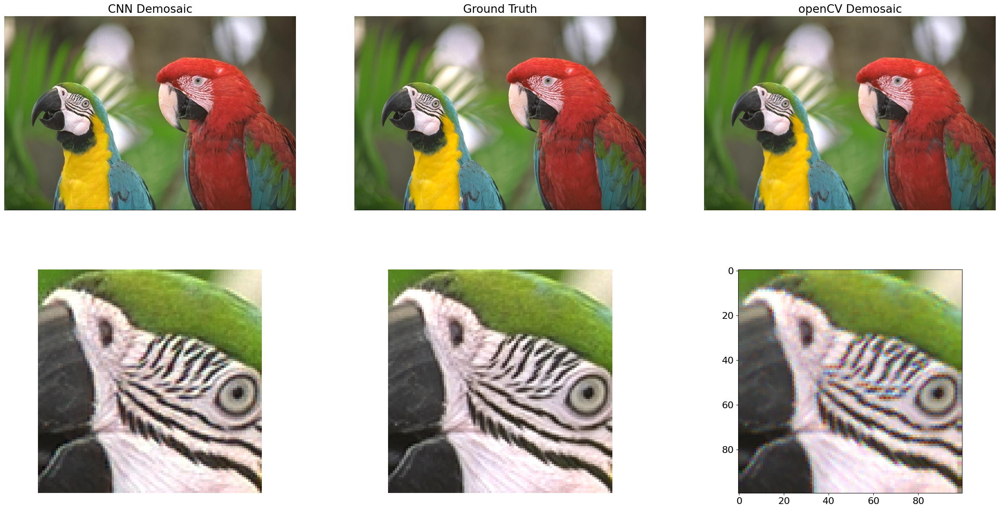

In [23]:
plt.figure(figsize=(30,15))
plt.subplot(2,3,1)
plt.title('CNN Demosaic')
plt.imshow(sampleImg[0,:,:,:])
plt.axis('off')
plt.subplot(2,3,2)
plt.title('Ground Truth')
plt.imshow(im[22,:,:,:])
plt.axis('off')
plt.subplot(2,3,3)
plt.title('openCV Demosaic')
plt.imshow(cv2.cvtColor(rgb2bayerGR2(im[22,:,:,:]), cv2.COLOR_BayerGR2BGR))
plt.axis('off')
plt.subplot(2,3,4)
plt.imshow(sampleImg[0,175:275,125:225,:])
plt.axis('off')
plt.subplot(2,3,5)
plt.imshow(im[22,175:275,125:225,:])
plt.axis('off')
plt.subplot(2,3,6)
plt.imshow(cv2.cvtColor(rgb2bayerGR2(im[22,175:275,125:225,:]), cv2.COLOR_BayerGR2BGR))

### Results of training

On the left there is the trained algorithm where we can see it very close to the ground truth image, the middle image. The openCV demosaic has a more blurred version of the ground truth but is also less blocky and more uniform across the image.

## Smart phone photo comparison

The smart phone I am using is the Apple Iphone 14 pro. The native file format for the apple is HEIC and the RAW format is the ProRAW which is not a true RAW format. It is something inbetween a png and a HEIC (post demosaicing). Using an app called Halide Mark II - Pro Camera, RAW smart phone images can be taken in png format. The photos can be outputed in HEIC format too at the time of capture. This version was used for the comparison following.

### Bayer pattern

In [24]:
!wget --no-check-certificate --content-disposition 'https://github.com/JudsonLima/computationalImaging/raw/master/images/PhoneImg/PhoneImg.jpg'
!wget --no-check-certificate --content-disposition 'https://github.com/JudsonLima/computationalImaging/raw/master/images/PhoneImg/PhoneImgR.dng'
!wget --no-check-certificate --content-disposition 'https://github.com/JudsonLima/computationalImaging/raw/master/images/smartPhone/smartPhone.jpg'
!wget --no-check-certificate --content-disposition 'https://github.com/JudsonLima/computationalImaging/raw/master/images/smartPhone/smartPhoneR.dng'

--2023-10-04 09:28:00--  https://github.com/JudsonLima/computationalImaging/raw/master/images/PhoneImg/PhoneImg.jpg
Resolving github.com (github.com)... 140.82.113.4
Connecting to github.com (github.com)|140.82.113.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/JudsonLima/computationalImaging/master/images/PhoneImg/PhoneImg.jpg [following]
--2023-10-04 09:28:01--  https://raw.githubusercontent.com/JudsonLima/computationalImaging/master/images/PhoneImg/PhoneImg.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.108.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2928321 (2.8M) [image/jpeg]
Saving to: ‘PhoneImg.jpg’

PhoneImg.jpg        100%[===================>]   2.79M  --.-KB/s    in 0.05s   

2023-10-04 09:28:01 (59.7 MB/s) - ‘PhoneImg.jpg

In [25]:
raw1 = rawpy.imread('PhoneImgR.dng')
rawImage1=raw1.raw_image_visible

raw2 = rawpy.imread('smartPhoneR.dng')
rawImage2=raw2.raw_image_visible

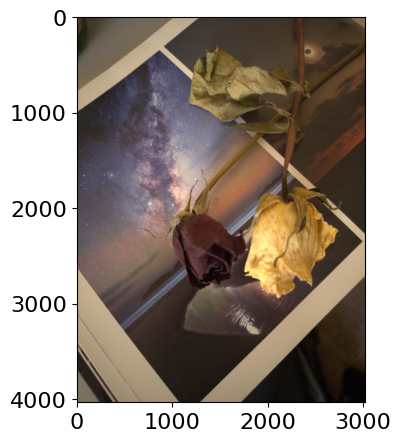

In [26]:
plt.imshow(raw1.postprocess())

(-0.5, 99.5, 99.5, -0.5)

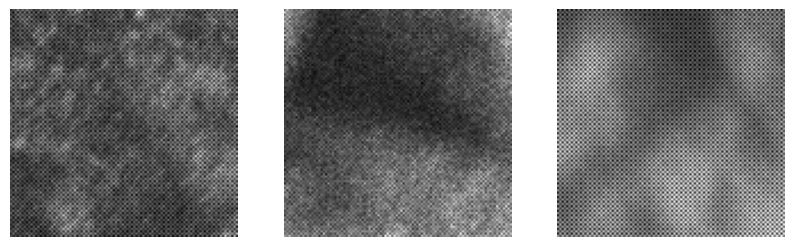

In [27]:
plt.gray()
plt.rcParams['figure.figsize'] = [20, 10]
plt.subplot(1,3,1)
plt.imshow(rawImage1[2100:2200,1800:1900])
plt.axis('off')
plt.subplot(1,3,2)
plt.imshow(rawImage1[1600:1700,2500:2600])
plt.axis('off')
plt.subplot(1,3,3)
plt.imshow(rawImage1[1000:1100,2600:2700])
plt.axis('off')

Star night (blue), Flower1 (maroon), and Flower2 (yellow)

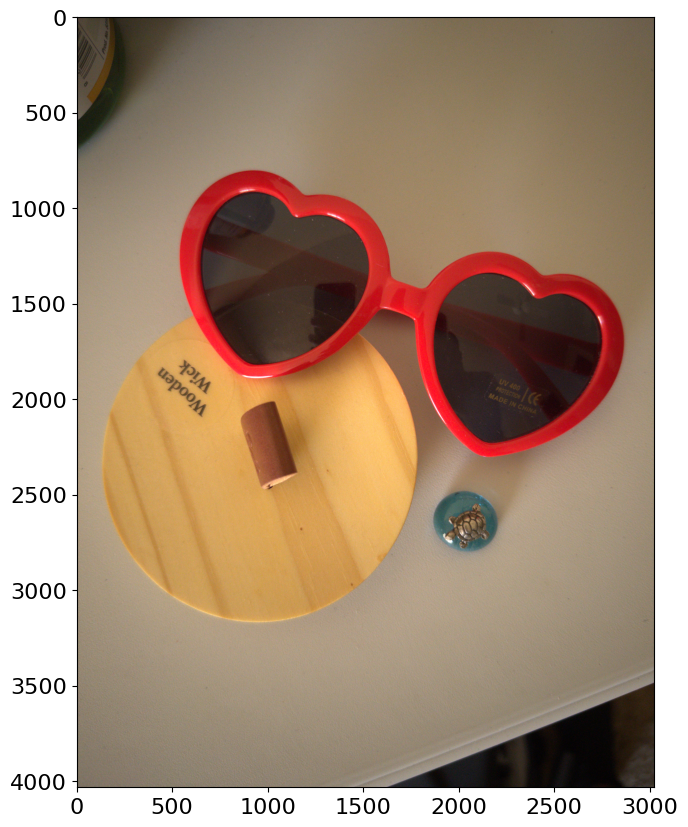

In [28]:
plt.imshow(raw2.postprocess())

(-0.5, 99.5, 99.5, -0.5)

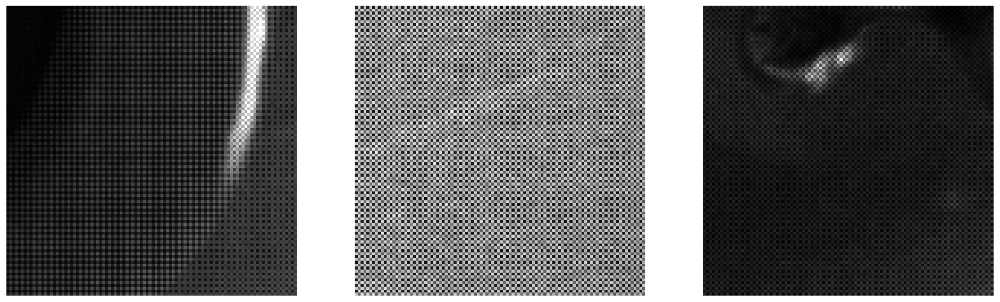

In [29]:
plt.gray()
plt.rcParams['figure.figsize'] = [20, 10]
plt.subplot(1,3,1)
plt.imshow(rawImage2[2100:2200,1800:1900])
plt.axis('off')
plt.subplot(1,3,2)
plt.imshow(rawImage2[1700:1800,2750:2850])
plt.axis('off')
plt.subplot(1,3,3)
plt.imshow(rawImage2[1050:1150,2600:2700])
plt.axis('off')

Glasses (red), wood (Tan), Pearl (blue)

In [30]:

imgr=np.zeros((2,2688,4032,3))
h = 2688
w = 4032
for pop1 in range(1,2):
  fileN1="PhoneImgR.dng"
  imr1 = Image.open(fileN1).crop((0, 168, w, h+168))
  imr2=np.array(imr1)
  w,h,c =imr2.shape
  if w>h:
    imr2=imr2.transpose(1,0,2)
  imgr[pop1-1,:,:,:]=np.array(imr2)/255.
for pop1 in range(2,3):
  fileN2="smartPhoneR.dng"
  imr1 = Image.open(fileN2).crop((0, 168, w, h+168))
  imr2=np.array(imr1)
  w,h,c =imr2.shape
  if w>h:
    imr2=imr2.transpose(1,0,2)
  imgr[pop1-1,:,:,:]=np.array(imr2)/255.


(-0.5, 4031.5, 2687.5, -0.5)

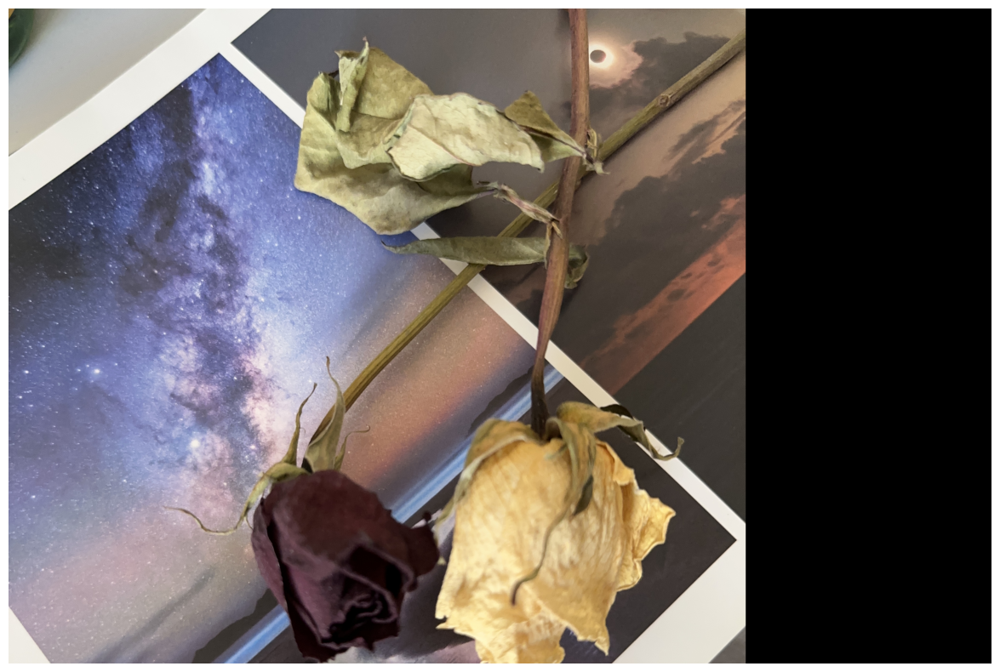

In [31]:
plt.imshow(imgr[0,:,:,:])
plt.axis('off')

(-0.5, 4031.5, 2687.5, -0.5)

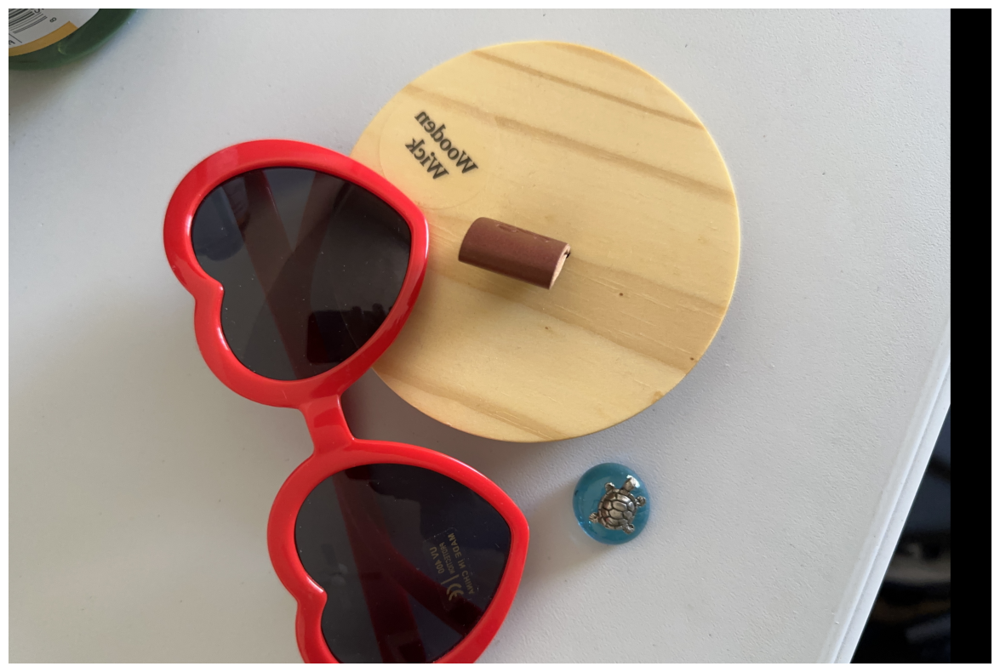

In [32]:
plt.imshow(imgr[1,:,:,:])
plt.axis('off')

### Load Demosaic training module

In [33]:
!wget --no-check-certificate --content-disposition 'https://github.com/JudsonLima/computationalImaging/raw/master/inverseProblems/Demosaic_10_03/demosaic.tar.gz'
!tar -xvf demosaic.tar.gz

--2023-10-04 09:28:26--  https://github.com/JudsonLima/computationalImaging/raw/master/inverseProblems/Demosaic_10_03/demosaic.tar.gz
Resolving github.com (github.com)... 140.82.113.4
Connecting to github.com (github.com)|140.82.113.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/JudsonLima/computationalImaging/master/inverseProblems/Demosaic_10_03/demosaic.tar.gz [following]
--2023-10-04 09:28:27--  https://raw.githubusercontent.com/JudsonLima/computationalImaging/master/inverseProblems/Demosaic_10_03/demosaic.tar.gz
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 214733 (210K) [application/octet-stream]
Saving to: ‘demosaic.tar.gz.1’

demosaic.tar.gz.1   100%[===================>] 209.70K  

In [34]:
demosaic = keras.models.load_model('demosaic')

In [35]:
PhoneImgS1=demosaic.predict(cfaSample.predict(imgr[0:1,:,:,:]))

1/1 [==============================] - 2s 2s/step


(-0.5, 299.5, 299.5, -0.5)

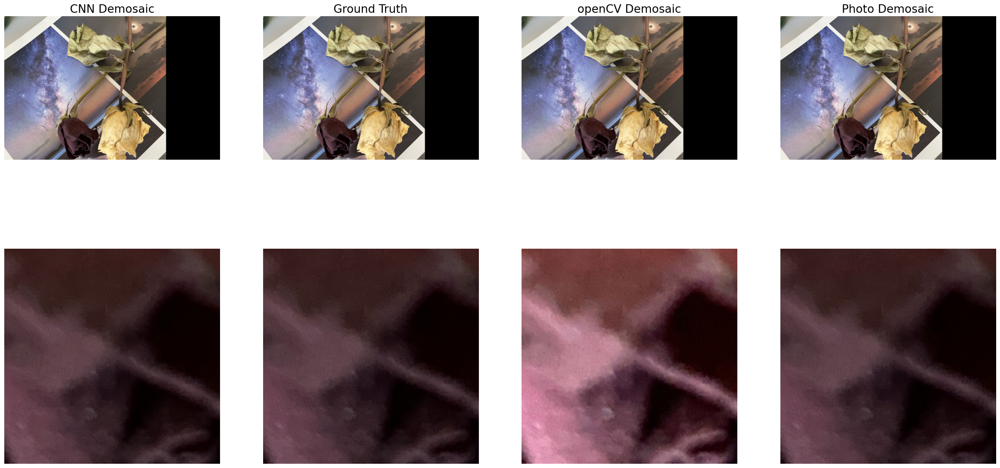

In [36]:


PhoneImg = Image.open("PhoneImg.jpg").crop((0, 168, w, h+168))
imr3=np.array(PhoneImg)/255.


plt.figure(figsize=(30,15))
plt.subplot(2,4,1)
plt.title('CNN Demosaic')
plt.imshow(PhoneImgS1[0,:,:,:])
plt.axis('off')
plt.subplot(2,4,2)
plt.title('Ground Truth')
plt.imshow(imgr[0,:,:,:])
plt.axis('off')
plt.subplot(2,4,3)
plt.title('openCV Demosaic')
plt.imshow(cv2.cvtColor(rgb2bayerGR2(imgr[0,:,:,:]), cv2.COLOR_BayerGR2BGR))
plt.axis('off')
plt.subplot(2,4,4)
plt.title('Photo Demosaic')
plt.imshow(imr3)
plt.axis('off')

plt.subplot(2,4,5)
plt.imshow(PhoneImgS1[0,2150:2450,1200:1500,:])
plt.axis('off')
plt.subplot(2,4,6)
plt.imshow(imgr[0,2150:2450,1200:1500,:])
plt.axis('off')
plt.subplot(2,4,7)
plt.imshow(cv2.cvtColor(rgb2bayerGR2(imgr[0,2150:2450,1200:1500,:]), cv2.COLOR_BayerGR2BGR))
plt.axis('off')
plt.subplot(2,4,8)
plt.imshow(imr3[2150:2450,1200:1500])
plt.axis('off')

In [37]:
PhoneImgS2=demosaic.predict(cfaSample.predict(imgr[1:2,:,:,:]))

1/1 [==============================] - 2s 2s/step


(-0.5, 299.5, 299.5, -0.5)

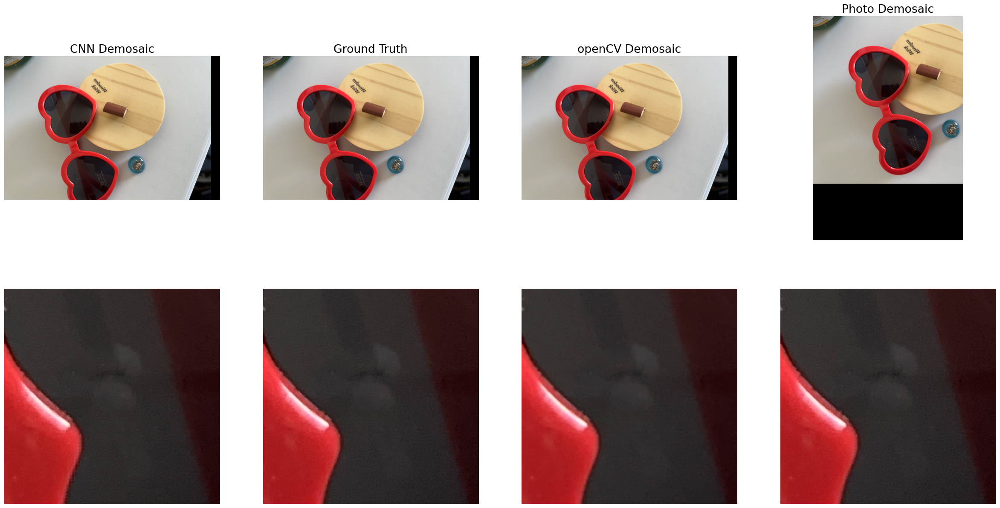

In [38]:


smartPhone = Image.open("smartPhone.jpg").crop((0, 168, w, h+168))
imr4=np.array(smartPhone).transpose(1,0,2)/255.


plt.figure(figsize=(30,15))
plt.subplot(2,4,1)
plt.title('CNN Demosaic')
plt.imshow(PhoneImgS2[0,:,:,:])
plt.axis('off')
plt.subplot(2,4,2)
plt.title('Ground Truth')
plt.imshow(imgr[1,:,:,:])
plt.axis('off')
plt.subplot(2,4,3)
plt.title('openCV Demosaic')
plt.imshow(cv2.cvtColor(rgb2bayerGR2(imgr[1,:,:,:]), cv2.COLOR_BayerGR2BGR))
plt.axis('off')
plt.subplot(2,4,4)
plt.title('Photo Demosaic')
plt.imshow(imr4)
plt.axis('off')

plt.subplot(2,4,5)
plt.imshow(PhoneImgS2[0,2200:2500,1200:1500,:])
plt.axis('off')
plt.subplot(2,4,6)
plt.imshow(imgr[1,2200:2500,1200:1500,:])
plt.axis('off')
plt.subplot(2,4,7)
plt.imshow(cv2.cvtColor(rgb2bayerGR2(imgr[1,2200:2500,1200:1500,:]), cv2.COLOR_BayerGR2BGR))
plt.axis('off')
plt.subplot(2,4,8)
plt.imshow(imr4[2200:2500,1200:1500])
plt.axis('off')

### Results

From the results above the phone images done are much more similar to the openCV algorithm. The CNN tends to shapren the image but still does a very good job of demosaicing. There was a bit of a hiccup formatting the files from the phone to 2:3 aspect ratio to match the algorithm. When the original 16:9 was used the photo, the algorithm broke and the arrays needed to be adjusted.

## Adding more layers to the algorithm

In [39]:
trainS=480
testS=96
xtrain=np.zeros((trainS,64,64,4))
ytrain=np.zeros((trainS,128,128,3))
xtest=np.zeros((testS,64,64,4))
ytest=np.zeros((testS,128,128,3))
for imc in range(20):
  for row in range(4):
    for column in range(6):
      ytrain[(imc*24+row*6+column),:,:,:]=im[imc,(row*128):((row+1)*128),(column*128):((column+1)*128),:]
      xtrain[(imc*24+row*6+column),:,:,:]=cfaSample.predict(im[imc:(imc+1),(row*128):((row+1)*128),(column*128):((column+1)*128),:])
for imc in range(4):
  for row in range(4):
    for column in range(6):
      ytest[(imc*24+row*6+column),:,:,:]=im[imc+20,(row*128):((row+1)*128),(column*128):((column+1)*128),:]
      xtest[(imc*24+row*6+column),:,:,:]=cfaSample.predict(im[(imc+20):(imc+21),(row*128):((row+1)*128),(column*128):((column+1)*128),:])
xtrain=np.reshape(xtrain, (len(xtrain), 64, 64, 4))
ytrain=np.reshape(ytrain, (len(ytrain), 128, 128, 3))
xtest=np.reshape(xtest, (len(xtest), 64, 64, 4))
ytest=np.reshape(ytest, (len(ytest), 128, 128, 3))
train_dataset = tf.data.Dataset.from_tensor_slices((xtrain, ytrain))
test_dataset = tf.data.Dataset.from_tensor_slices((xtest,ytest))
BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 100

train_dataset = train_dataset.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
test_dataset = test_dataset.batch(BATCH_SIZE)

1/1 [==============================] - 0s 19ms/step


In [40]:
inputs = layers.Input(shape=(None,None,4))
# Encoder
x1 = layers.Conv2D(16, (2, 2), strides=2, activation="gelu", padding="same")(inputs)
x = layers.MaxPooling2D((2, 2))(x1)
x2 = layers.Conv2D(16, (3, 3), activation="gelu", padding="same")(x)
x3 = layers.Conv2D(16, (3, 3), strides=2, activation="relu", padding="same")(x2)
x = layers.MaxPooling2D((2, 2))(x3)

x4 = layers.MaxPooling2D((2, 2))(x)
x5 = layers.Conv2D(16, (3, 3),  activation="gelu", padding="same")(x4)
x = layers.Conv2D(16, (3, 3),  activation="gelu", padding="same")(x5)

# Decoder
x = layers.Conv2DTranspose(16, (3, 3), strides=2, activation="gelu", padding="same")(x)
x = layers.Conv2DTranspose(16, (3, 3), strides=2, activation="gelu", padding="same")(x)
x=layers.add([x,x3])
x = layers.Conv2DTranspose(16, (3, 3), strides=2, activation="gelu", padding="same")(x)

x=layers.add([x,x2])
x = layers.Conv2DTranspose(16, (3, 3), strides=2, activation="gelu", padding="same")(x)
x=layers.add([x,x1])
x = layers.Conv2DTranspose(4, (3, 3), strides=2, activation="gelu", padding="same")(x)
x=layers.add([x,inputs])
x = layers.Conv2DTranspose(3, (3, 3), strides=2, activation="gelu", padding="same")(x)
x = layers.Conv2D(3, (3, 3), activation="relu", padding="same")(x)

# Autoencoder
demosaic = Model(inputs, x)
demosaic.compile(optimizer="adam", loss="mean_squared_error")
demosaic.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, None, None, 4)]      0         []                            
                                                                                                  
 conv2d_6 (Conv2D)           (None, None, None, 16)       272       ['input_3[0][0]']             
                                                                                                  
 max_pooling2d_2 (MaxPoolin  (None, None, None, 16)       0         ['conv2d_6[0][0]']            
 g2D)                                                                                             
                                                                                                  
 conv2d_7 (Conv2D)           (None, None, None, 16)       2320      ['max_pooling2d_2[0][0]'

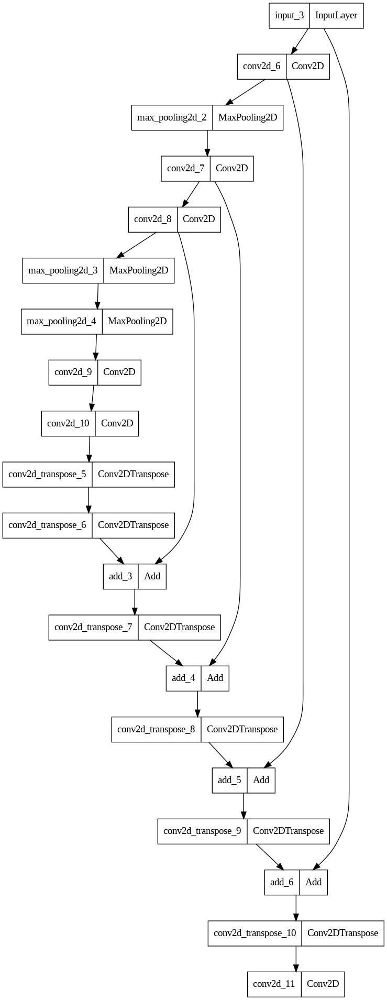

In [41]:
keras.utils.plot_model(demosaic)

In [42]:
demosaic.fit(train_dataset,
    epochs=1000,
    batch_size=32,
    shuffle=True,
    validation_data=test_dataset
)

Epoch 1/1000
15/15 [==============================] - 8s 335ms/step - loss: 0.1556 - val_loss: 0.1101
Epoch 2/1000
15/15 [==============================] - 5s 348ms/step - loss: 0.1332 - val_loss: 0.0944
Epoch 3/1000
15/15 [==============================] - 4s 300ms/step - loss: 0.1082 - val_loss: 0.0735
Epoch 4/1000
15/15 [==============================] - 6s 386ms/step - loss: 0.0831 - val_loss: 0.0539
Epoch 5/1000
15/15 [==============================] - 4s 298ms/step - loss: 0.0540 - val_loss: 0.0374
Epoch 6/1000
15/15 [==============================] - 5s 335ms/step - loss: 0.0349 - val_loss: 0.0271
Epoch 7/1000
15/15 [==============================] - 5s 334ms/step - loss: 0.0222 - val_loss: 0.0189
Epoch 8/1000
15/15 [==============================] - 4s 298ms/step - loss: 0.0149 - val_loss: 0.0152
Epoch 9/1000
15/15 [==============================] - 6s 384ms/step - loss: 0.0123 - val_loss: 0.0138
Epoch 10/1000
15/15 [==============================] - 5s 330ms/step - loss: 0.011

In [43]:
demosaic.save("demosaic")
!tar -czvf demosaic2.tar.gz demosaic/
files.download('demosaic2.tar.gz')

demosaic/
demosaic/saved_model.pb
demosaic/assets/
demosaic/fingerprint.pb
demosaic/variables/
demosaic/variables/variables.data-00000-of-00001
demosaic/variables/variables.index
demosaic/keras_metadata.pb


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [44]:
sampleImg=demosaic.predict(cfaSample.predict(im[22:23,:,:,:]))

1/1 [==============================] - 0s 305ms/step


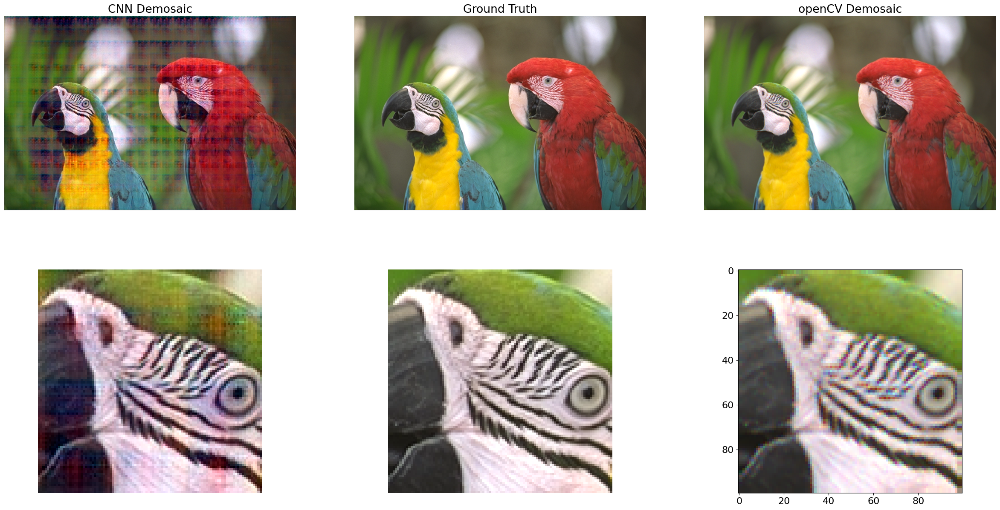

In [45]:
plt.figure(figsize=(30,15))
plt.subplot(2,3,1)
plt.title('CNN Demosaic')
plt.imshow(sampleImg[0,:,:,:])
plt.axis('off')
plt.subplot(2,3,2)
plt.title('Ground Truth')
plt.imshow(im[22,:,:,:])
plt.axis('off')
plt.subplot(2,3,3)
plt.title('openCV Demosaic')
plt.imshow(cv2.cvtColor(rgb2bayerGR2(im[22,:,:,:]), cv2.COLOR_BayerGR2BGR))
plt.axis('off')
plt.subplot(2,3,4)
plt.imshow(sampleImg[0,175:275,125:225,:])
plt.axis('off')
plt.subplot(2,3,5)
plt.imshow(im[22,175:275,125:225,:])
plt.axis('off')
plt.subplot(2,3,6)
plt.imshow(cv2.cvtColor(rgb2bayerGR2(im[22,175:275,125:225,:]), cv2.COLOR_BayerGR2BGR))

### Results
When editing the model, it is  difficult to maintain a goood array count while adding layers. It seem that lowering the pixel count will result in overfitting and the images do not look as good in the end. This way of adding more layers hardly resulted in more parameters, there was one model that added much more parameters but at that point the algorithm would have had to run at 1x1x16.

## Siren neural algorith

Siren model using a different activation sequence, a sine layer, with a Bayer grid pattern and then reconstructing the missing color samples by interpolation at up sampled values of the grid. The output thus produces green, blue and red images shifted by one pixel relative to each other. Shifting the images back in composition produces the estimated frame.

### Siren layer

In [46]:
class SineLayer(nn.Module):
    # See paper sec. 3.2, final paragraph, and supplement Sec. 1.5 for discussion of omega_0.

    # If is_first=True, omega_0 is a frequency factor which simply multiplies the activations before the
    # nonlinearity. Different signals may require different omega_0 in the first layer - this is a
    # hyperparameter.

    # If is_first=False, then the weights will be divided by omega_0 so as to keep the magnitude of
    # activations constant, but boost gradients to the weight matrix (see supplement Sec. 1.5)

    def __init__(self, in_features, out_features, bias=True,
                 is_first=False, omega_0=30):
        super().__init__()
        self.omega_0 = omega_0
        self.is_first = is_first

        self.in_features = in_features
        self.linear = nn.Linear(in_features, out_features, bias=bias)

        self.init_weights()

    def init_weights(self):
        with torch.no_grad():
            if self.is_first:
                self.linear.weight.uniform_(-1 / self.in_features,
                                             1 / self.in_features)
            else:
                self.linear.weight.uniform_(-np.sqrt(6 / self.in_features) / self.omega_0,
                                             np.sqrt(6 / self.in_features) / self.omega_0)

    def forward(self, input):
        return torch.sin(self.omega_0 * self.linear(input))

    def forward_with_intermediate(self, input):
        # For visualization of activation distributions
        intermediate = self.omega_0 * self.linear(input)
        return torch.sin(intermediate), intermediate


class Siren(nn.Module):
    def __init__(self, in_features, hidden_features, hidden_layers, out_features, outermost_linear=False,
                 first_omega_0=30, hidden_omega_0=30.):
        super().__init__()

        self.net = []
        self.net.append(SineLayer(in_features, hidden_features,
                                  is_first=True, omega_0=first_omega_0))

        for i in range(hidden_layers):
            self.net.append(SineLayer(hidden_features, hidden_features,
                                      is_first=False, omega_0=hidden_omega_0))

        if outermost_linear:
            final_linear = nn.Linear(hidden_features, out_features)

            with torch.no_grad():
                final_linear.weight.uniform_(-np.sqrt(6 / hidden_features) / hidden_omega_0,
                                              np.sqrt(6 / hidden_features) / hidden_omega_0)

            self.net.append(final_linear)
        else:
            self.net.append(SineLayer(hidden_features, out_features,
                                      is_first=False, omega_0=hidden_omega_0))

        self.net = nn.Sequential(*self.net)

    def forward(self, coords):
        coords = coords.clone().detach().requires_grad_(True) # allows to take derivative w.r.t. input
        output = self.net(coords)
        return output, coords

    def forward_with_activations(self, coords, retain_grad=False):
        '''Returns not only model output, but also intermediate activations.
        Only used for visualizing activations later!'''
        activations = OrderedDict()

        activation_count = 0
        x = coords.clone().detach().requires_grad_(True)
        activations['input'] = x
        for i, layer in enumerate(self.net):
            if isinstance(layer, SineLayer):
                x, intermed = layer.forward_with_intermediate(x)

                if retain_grad:
                    x.retain_grad()
                    intermed.retain_grad()

                activations['_'.join((str(layer.__class__), "%d" % activation_count))] = intermed
                activation_count += 1
            else:
                x = layer(x)

                if retain_grad:
                    x.retain_grad()

            activations['_'.join((str(layer.__class__), "%d" % activation_count))] = x
            activation_count += 1

        return activations

Differential operators leverage autograd to compute gradients, the laplacian, etc.

In [47]:
def laplace(y, x):
    grad = gradient(y, x)
    return divergence(grad, x)


def divergence(y, x):
    div = 0.
    for i in range(y.shape[-1]):
        div += torch.autograd.grad(y[..., i], x, torch.ones_like(y[..., i]), create_graph=True)[0][..., i:i+1]
    return div


def gradient(y, x, grad_outputs=None):
    if grad_outputs is None:
        grad_outputs = torch.ones_like(y)
    grad = torch.autograd.grad(y, [x], grad_outputs=grad_outputs, create_graph=True)[0]
    return grad

###Setting image to use for demosaicking

In [52]:
def get_image_tensor():
    img = Image.open('PhoneImgR.dng')
    transform = Compose([
        PILToTensor()
    ])
    img = transform(img)
    img=img[:,:3024,:3024]/255.
    return img

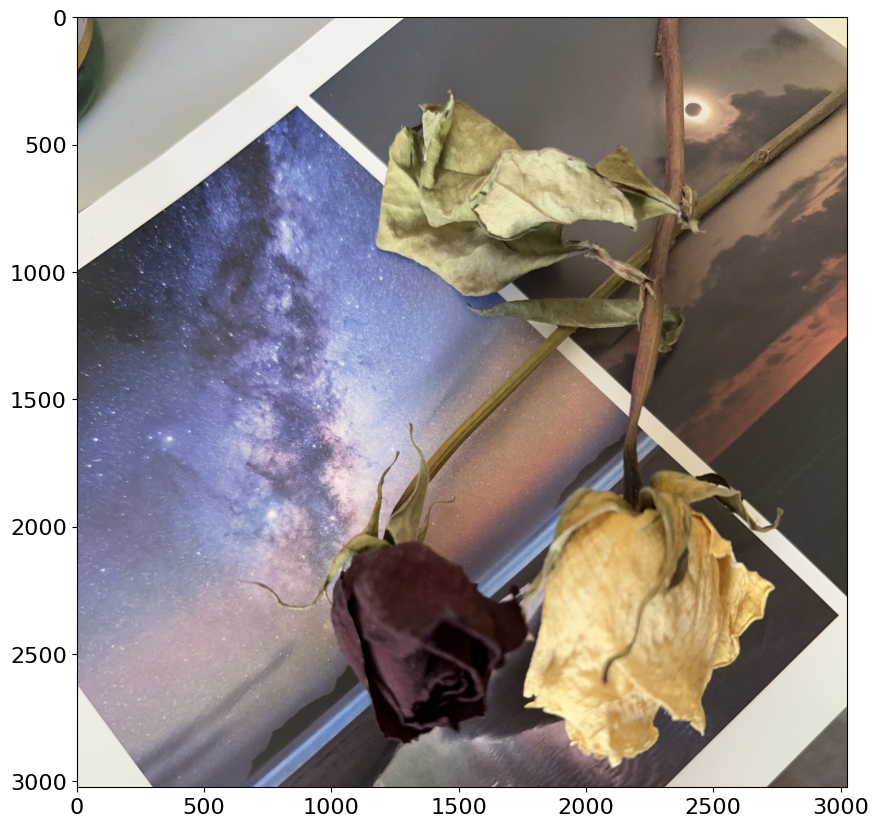

In [53]:
pop3=get_image_tensor()
pip1=pop3.permute(1,2,0).numpy()
plt.imshow(pip1)

### Fitting the image with a SIREN

The goal is to obtain the function $\Phi$ such that:
$\mathcal{L}=\int_{\Omega} \lVert \Phi(\mathbf{x}) - f(\mathbf{x}) \rVert\mathrm{d}\mathbf{x}$
 is minimized, in which $\Omega$ is the domain of the image.

RGBimagefitting calculates per-pixel coordinates and the 4 element RGBG data element at each pixel (per group).

In [54]:
class RGBImageFitting(Dataset):
    def __init__(self, sidelength):
        super().__init__()
        img=get_image_tensor()
        self.pixelsGRGB = torch.stack([img[1, ::2,::2], img[0, ::2,1::2],  img[2, 1::2,::2], img[1, 1::2,1::2]])
        self.pixelsGRGB= self.pixelsGRGB.permute(1,2,0)
        self.pixelsGRGB= self.pixelsGRGB.reshape(-1,4)
        self.coords = get_mgrid(np.uint16(sidelength/2), 2)
        #self.coords = get_mgrid(32, 2)
    def __len__(self):
        return 1

    def __getitem__(self, idx):
        if idx > 0: raise IndexError

        return self.coords, self.pixelsGRGB

Instantiate the dataset and our Siren. As pixel coordinates are 2D, the siren has 2 input features and 4 GRBG output channels

In [56]:
Roses = RGBImageFitting(3024)
dataloader = DataLoader(Roses, batch_size=1, pin_memory=True, num_workers=0, shuffle=True)

img_siren = Siren(in_features=2, out_features=4, hidden_features=3024,
                  hidden_layers=3, outermost_linear=True)
#img_siren.cuda()

We now fit Siren in a simple training loop. Within only hundreds of iterations, the image and its gradients are approximated well.

In [ ]:
total_steps = 1000 #
steps_til_summary = 50

optim = torch.optim.Adam(lr=1e-4, params=img_siren.parameters())

model_input, ground_truth = next(iter(dataloader))
#model_input, ground_truth = model_input.cuda(), ground_truth.cuda()

for step in range(total_steps):
    model_output, coords = img_siren(model_input)
    loss = ((model_output - ground_truth)**2).mean()

    if not step % steps_til_summary:
        print("Step %d, Total loss %0.6f" % (step, loss))

    optim.zero_grad()
    loss.backward()
    optim.step()

### Estimating the image

In [ ]:
upModel, coords=img_siren(get_mgrid(3025, 2).cuda())

In [ ]:
pop4=upModel.cpu().detach().numpy()

In [ ]:
green1=np.reshape(pop4[:,0],(3025,3025))
green2=np.reshape(pop4[:,3],(3025,3025))
red=np.reshape(pop4[:,1],(3025,3025))
blue=np.reshape(pop4[:,2],(3025,3025))

The shift in the 4 color planes in the estimate is illustrated by image differences. The green planes difference is shown below.

In [ ]:
plt.imshow(green1-green2)

shifting the greens planes along the diagonal prior to taking the difference reduces the difference

In [ ]:
plt.imshow(green2[:3024,:3024]-green1[1:,1:])

Green and red are shifted horizontally

In [ ]:
plt.imshow(green2-red)

In [ ]:
plt.imshow(green2[:3024,:3024]-blue[:3024,1:])

In [ ]:
recon=np.stack((red[1:,:3024], (green2[:3024,:3024]+green1[1:,1:])/2,blue[:3024,1:]), axis=-1)

In [ ]:
plt.figure(figsize=(20,20))
plt.subplot(2,2,1)
plt.imshow(recon)
plt.subplot(2,2,2)
plt.imshow(pip1)
plt.subplot(2,2,3)
plt.imshow(recon[250:350,350:450,:])
plt.subplot(2,2,4)
plt.imshow(pip1[250:350,350:450,:])

In [ ]:
psnr(pip1,recon)

### Comparing PSNR to CNN demosaicking algorithm

In [ ]:
estimates=demosaic.predict(cfaSample.predict(im))

Mean of trained Kodak photos

In [ ]:
pp=0
for pop in range(im.shape[0]):
  p=psnr(im[pop,:,:,:],np.float64(estimates[pop,:,:,:]))
  print("estimation psnr is ", p)
  pp=pp+p
print('the mean psnr is ', pp/np.float64(im.shape[0]))

In [ ]:
pp=0
for pop in range(im.shape[0]):
  p=psnr(im[pop,:,:,:],np.float64(cv2.cvtColor(rgb2bayerGR2(im[pop,:,:,:]), cv2.COLOR_BayerGR2BGR)/255.))
  print("cv2 psnr is ", p)
  pp=pp+p
print('the mean psnr is ', pp/np.float64(im.shape[0]))

If we are comparing the PSNR the demosaicking from the CNN algorithm and the openCV to the Siren the results speak for themselves with a huge consideration that the Siren did its estimation using one image. The comupation time was very different task too which could also been seen as a benefit.